##**Prepare data and environment(beta)**

In [1]:
%cd ..

/dellnas/home/tandongli/workdir/ECO-TR


##**Load inference engine**

In [2]:
import os,sys
import random
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from dotmap import DotMap
from src.config.default import get_cfg_defaults
from src.utils.misc import lower_config
from src.models.ecotr_engines import *
from src.models.utils.utils import *

dict = DotMap(lower_config(get_cfg_defaults()))
dict.ecotr.engine.device='cuda:4'
fix_randomness(42)
engine=ECOTR_Engine(dict.ecotr)


##**Select image pairs**

In [3]:
torch.cuda.empty_cache()

pairs=[['./assets/34256848_2093205455.jpg','./assets/63163121_2253976476.jpg'], #taj
      ['./assets/recon_img_0.jpg','./assets/recon_img_1.jpg'], 
      ['./assets/NIR01.jpg','./assets/photo.jpg'],
      ['./assets/sxc_sketch.jpg','./assets/sxc_photo.jpg']]
idx=1
img0=cv2.imread(pairs[idx][0])[...,[2,1,0]]
img1=cv2.imread(pairs[idx][1])[...,[2,1,0]]

##**Func1. Coarse to fine Inference**

In [4]:
engine.MAX_KPTS_NUM=10000
engine.ASPECT_RATIOS=[1.0,1.5]

#coarse2fine 
matches=engine.forward(img0,img1,cycle=True,level='fine')

#coarse2fine with scale estimation
# matches=engine.forward_2stage(img0,img1,cycle=False)

#Func2. Refine matches provided by other methods(eg:spsg)**
# matches=engine.forward_refine(img0,img1,
#   queries = matches[:,:2].reshape(-1,2),
#   corrs = matches[:,2:4].reshape(-1,2))

mask=matches[:,-1]<1e-2
matches=matches[mask]

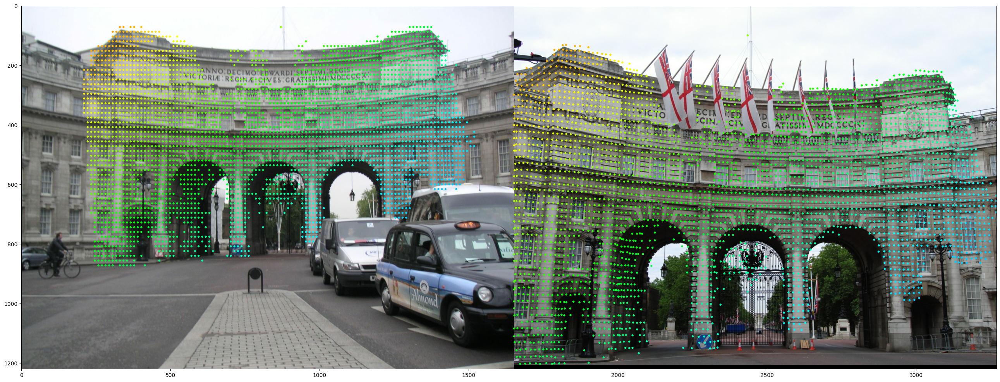

In [5]:
canvas = draw_matches(img0,img1,matches.copy(),'dot')
height,width = canvas.shape[:2]

dpi=100
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize)
plt.imshow(canvas)
plt.show()

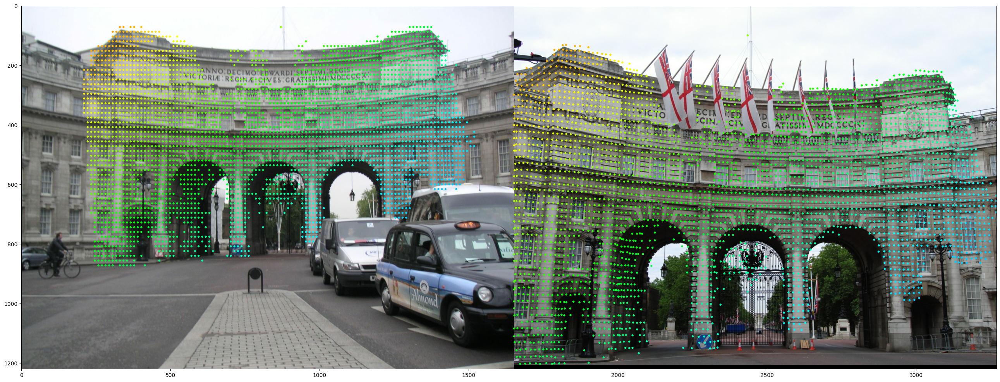

In [6]:
canvas = draw_matches(img0,img1,matches.copy(),'dot')
height,width = canvas.shape[:2]

dpi=100
figsize = width / float(dpi), height / float(dpi)
plt.figure(figsize=figsize)
plt.imshow(canvas)
plt.show()